In [1]:
import sys
sys.path.insert(1,'../')

import warnings
warnings.filterwarnings('ignore')

In [2]:
from data.dataloader import ImageNetA, get_dataloader
from data.datautils import PatchAugmenter, AugmenterTPT, get_base_transform, get_clip_preprocess, get_normalizer, get_preaugment, get_unnormalizer, _convert_image_to_rgb
import numpy as np
import torch
import torchvision.transforms.functional as F

clip_preprocess = get_clip_preprocess()
normalizer = get_normalizer()
unnormalizer = get_unnormalizer()

In [3]:
import matplotlib.pyplot as plt
from math import ceil

def show_imgs(images, images_per_row=4):
    """
    Display a list of PIL images in a grid using Matplotlib, with the first image
    highlighted in its own row, and the rest shown in a grid.

    Args:
        images (list): List of PIL.Image objects to display.
        images_per_row (int): Number of images to display per row for the grid. Default is 5.

    Returns:
        None
    """
    if not images:
        raise ValueError("The images list is empty.")

    # Separate the first image
    first_image = images[0]
    first_image = F.to_pil_image(unnormalizer(first_image))
    other_images = images[1:]

    # Calculate grid dimensions for the other images
    num_images = len(other_images)
    num_rows = ceil(num_images / images_per_row)

    # Create the figure
    fig, axes = plt.subplots(num_rows + 1, images_per_row, figsize=(images_per_row * 3, (num_rows + 1) * 3))
    axes = axes.reshape(-1, images_per_row)  # Reshape to handle rows and columns

    # Highlight the first image in the first row
    first_row_axes = axes[0]
    for ax in first_row_axes:
        ax.axis("off")  # Turn off all axes in the first row
    first_row_axes[0].imshow(first_image)
    first_row_axes[0].axis("on")  # Turn on the axis for the first image

    # Display the remaining images in a grid
    for ax, img in zip(axes[1:].flatten(), other_images):
        img = F.to_pil_image(unnormalizer(img))
        ax.imshow(img)
        ax.axis("off")  # Turn off axis for grid images

    # Hide any extra subplots
    for ax in axes[1:].flatten()[num_images:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

stingray


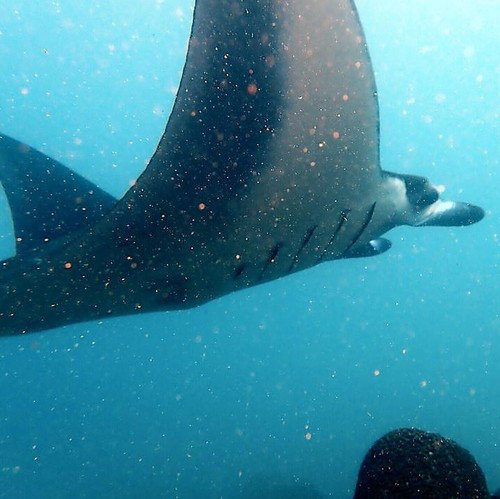

In [4]:
dt = ImageNetA("../../Datasets/imagenet-a/")
classnames = ImageNetA.classnames

x = dt[50]
image = x[0]
label = classnames[x[1]]

print(label)
image

# Base operations

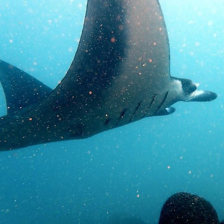

In [5]:
F.to_pil_image(unnormalizer(clip_preprocess(image)))

# AugmenterTPT

## no augmix

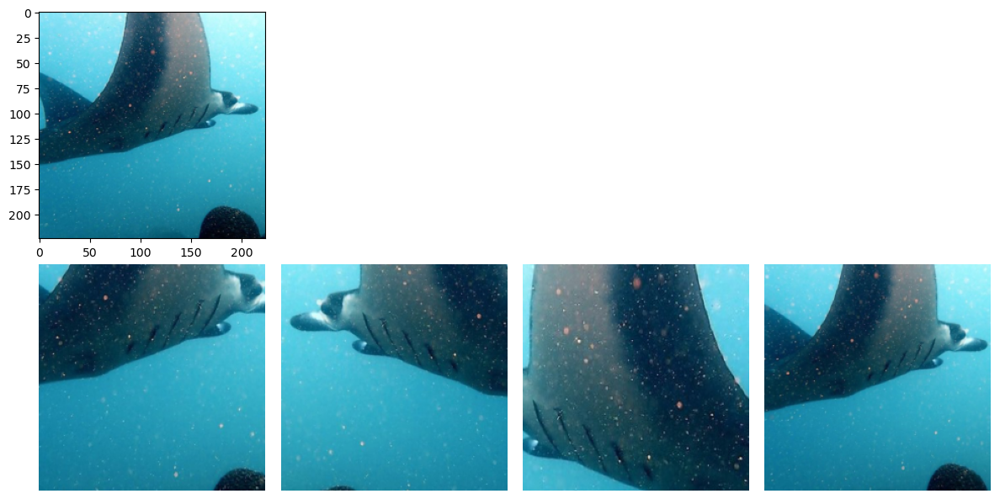

In [6]:
imgaug = AugmenterTPT(n_aug=4)(image)

show_imgs(imgaug[1:])

## augmix

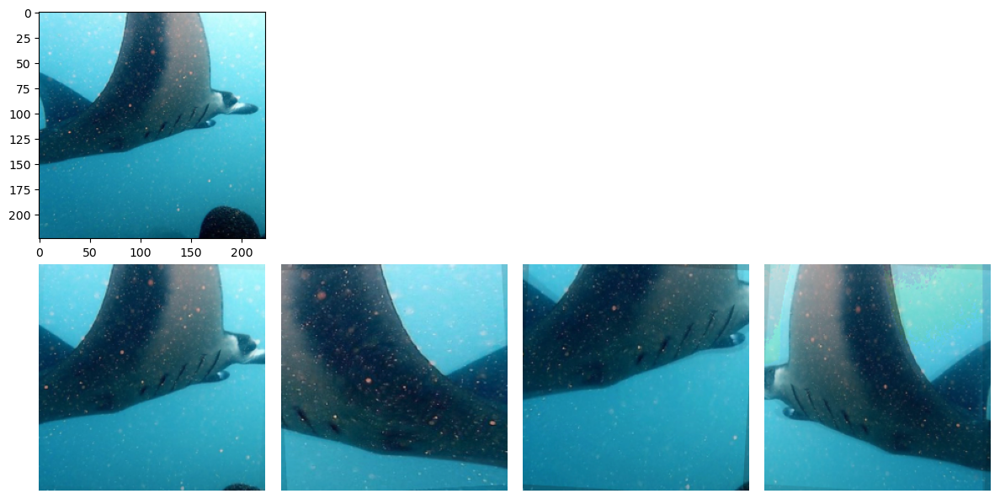

In [7]:
imgaug = AugmenterTPT(n_aug=4, augmix=True, severity=2)(image)

show_imgs(imgaug[1:])

# PatchAugmeter

## Only patches

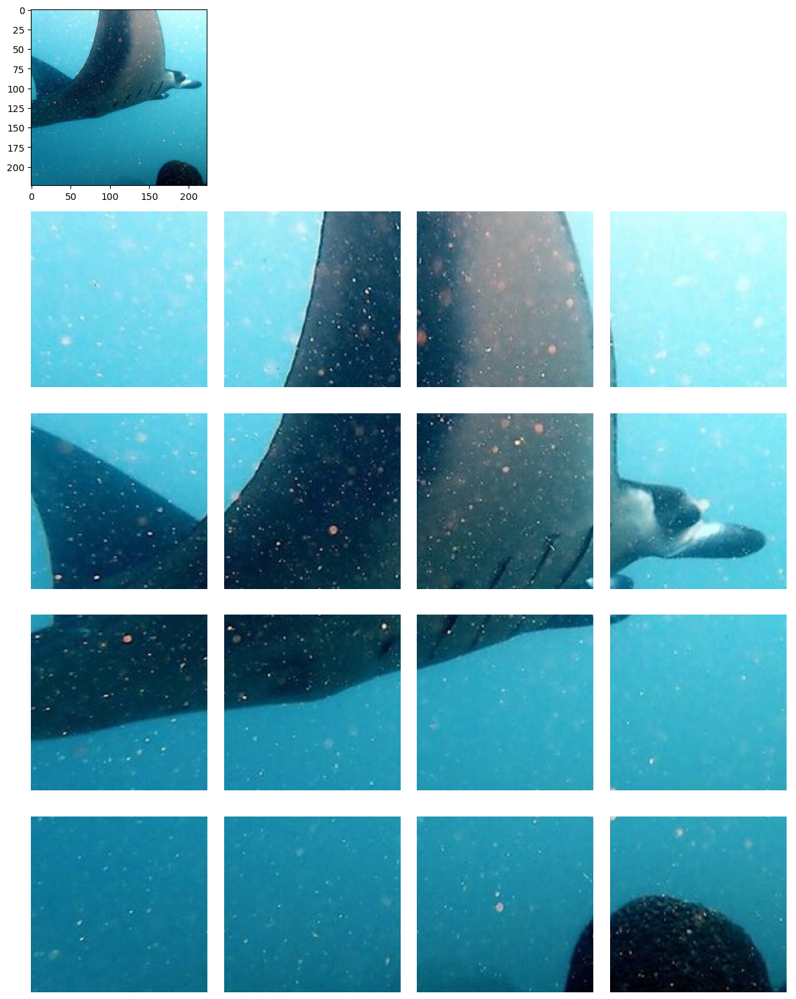

In [11]:
imgaug = PatchAugmenter(n_patches=16, n_aug=0, overlap=0.0)(image)

show_imgs(imgaug[1:], images_per_row=4)

## Patches + augumentation

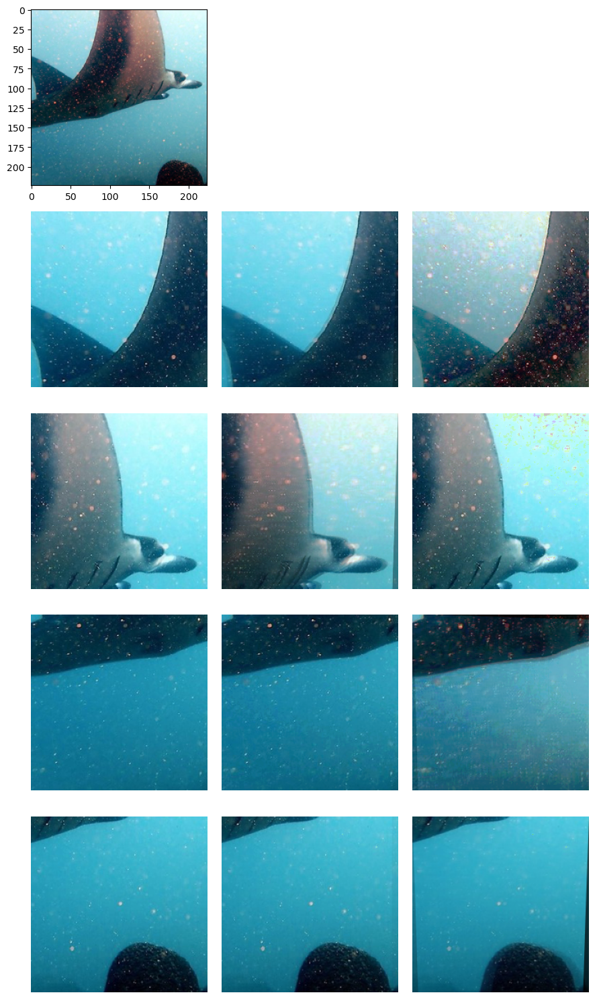

In [9]:
imgaug = PatchAugmenter(n_patches=4, n_aug=2, overlap=0.0, augmix=True, severity=2)(image)

show_imgs(imgaug[3:], images_per_row=3)

## Overlapped Patches


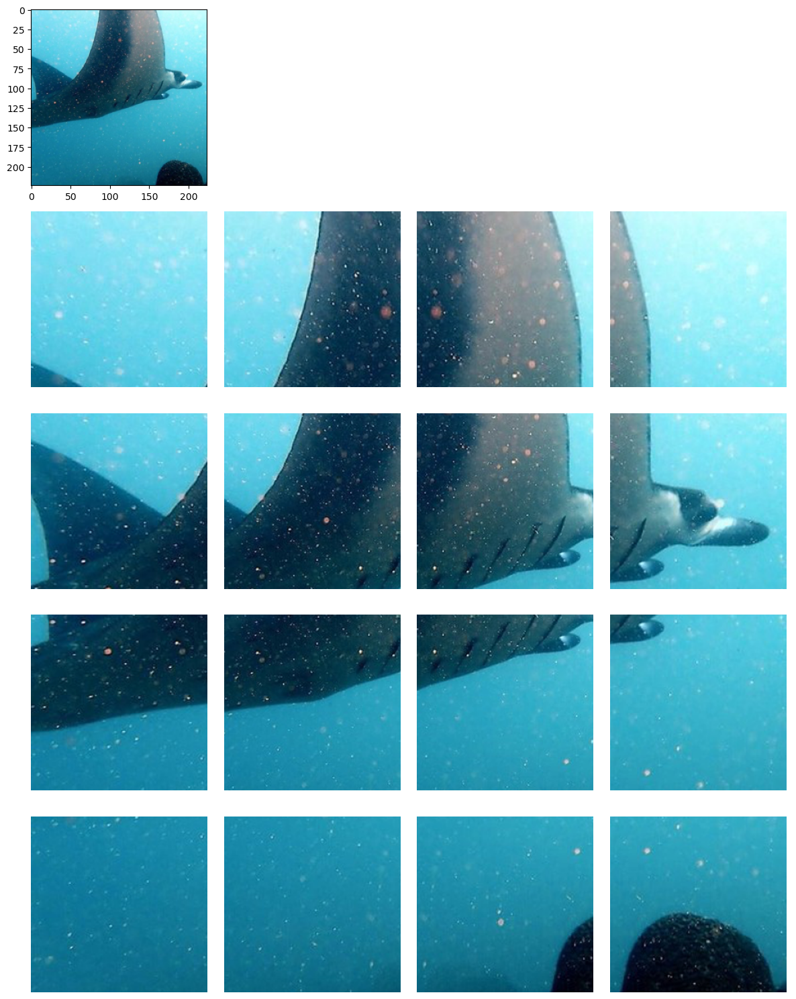

In [12]:
imgaug = PatchAugmenter(n_patches=16, n_aug=0, overlap=0.25)(image)

show_imgs(imgaug[1:], images_per_row=4)

## Overlapped patches + augumentation

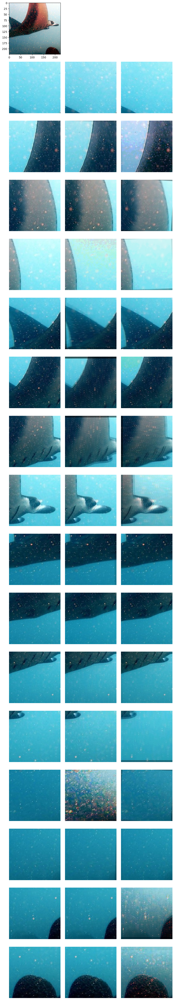

In [14]:
imgaug = PatchAugmenter(n_patches=16, n_aug=2, overlap=0.25, augmix=True, severity=2)(image)

show_imgs(imgaug[3:], images_per_row=3)